In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

from sklearn.decomposition import PCA

import statsmodels.api as sm
from scipy.stats import norm, shapiro, ttest_rel, wilcoxon

from typing import Optional, Tuple, List, Self

from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

In [3]:
data = np.load('data.npz')
data

NpzFile 'home_task.npz' with keys: vol

# Quick EDA

There is a parallelepiped (320, 670, 200). Most of voxels are black.

#### NB!
Because I used z-section images created with plt.imshow, the parallelepiped's coordinate system changed. This may cause confusion in some places. If I could continue working on this project, I would convert everything to a single coordinate system. The parallelepiped's dimensions are now: Y: 320, X: 620, Z: 200.

In [4]:
data = data['vol']
print(f"shape: {data.shape}")
print(f"min: {data.min()}")
print(f"max: {data.max()}")
print(f"mean(): {data.mean()}")
print(f"std: {data.std()}")

shape: (320, 670, 200)
min: 9.99999993922529e-09
max: 4.672940254211426
mean(): 0.858672022819519
std: 0.5820272564888


I will analyze the rebar, that was used in the example. It appears at layers 80..90-92. At later layers it is practically indistinguishable.
Defect locations are marked with green lines

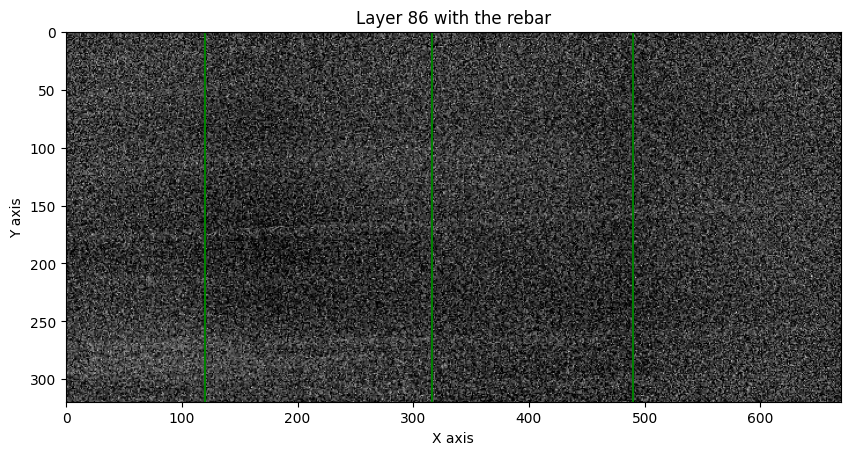

In [5]:
layer = data[:,:, 86]

plt.figure(figsize=(10, 20))
plt.imshow(layer, cmap='gray')
plt.title('Layer 86 with the rebar')
plt.xlabel('X axis')
plt.ylabel('Y axis')

plt.axvline(120, c='green')
plt.axvline(316, c='green')
plt.axvline(490, c='green')

plt.show()

In [6]:
layer.shape

(320, 670)

Look at the layers

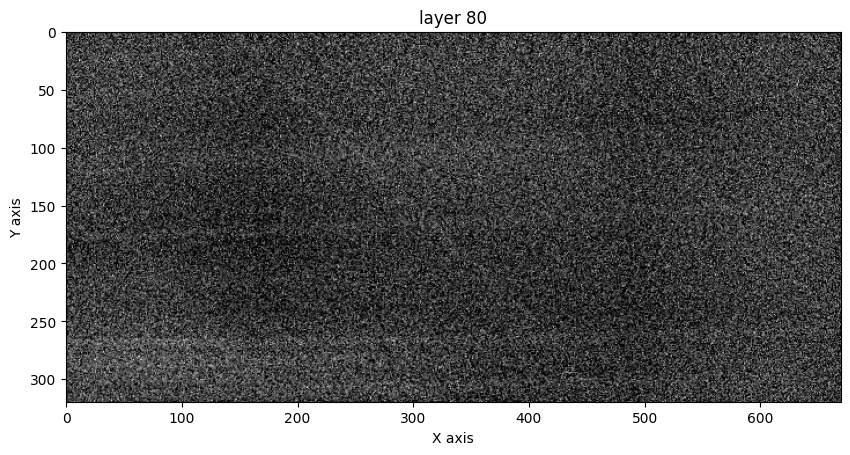

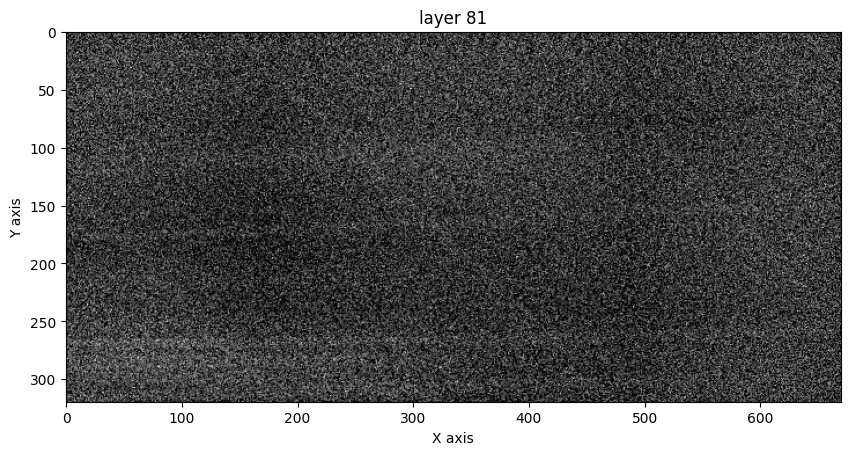

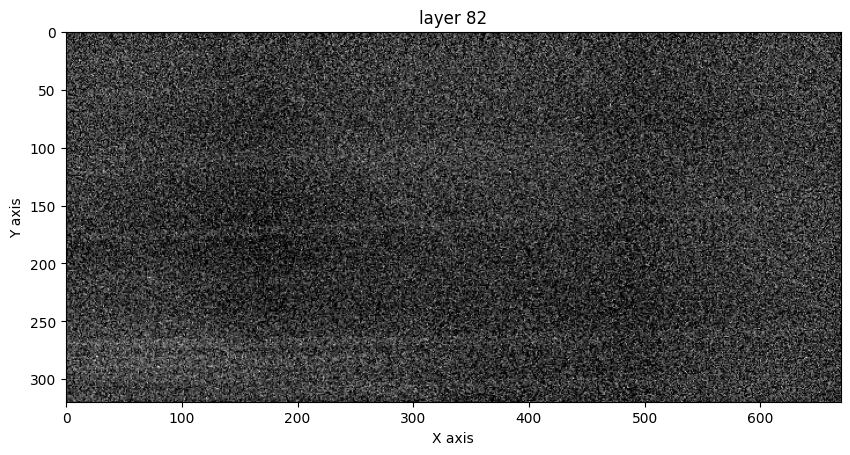

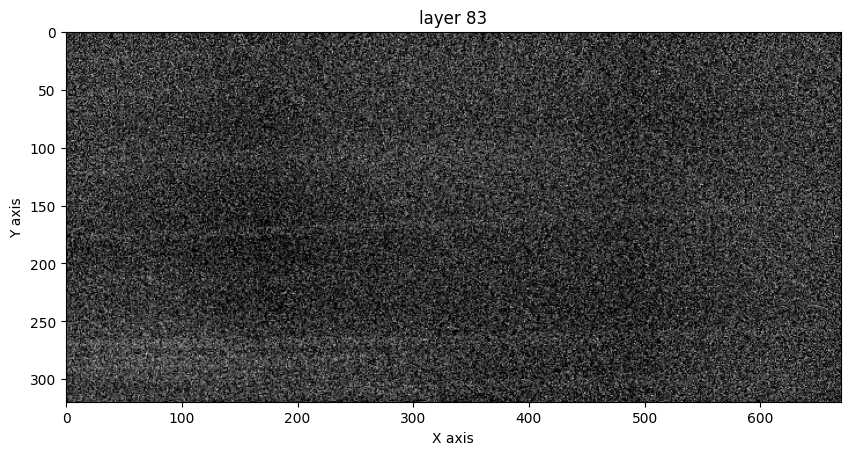

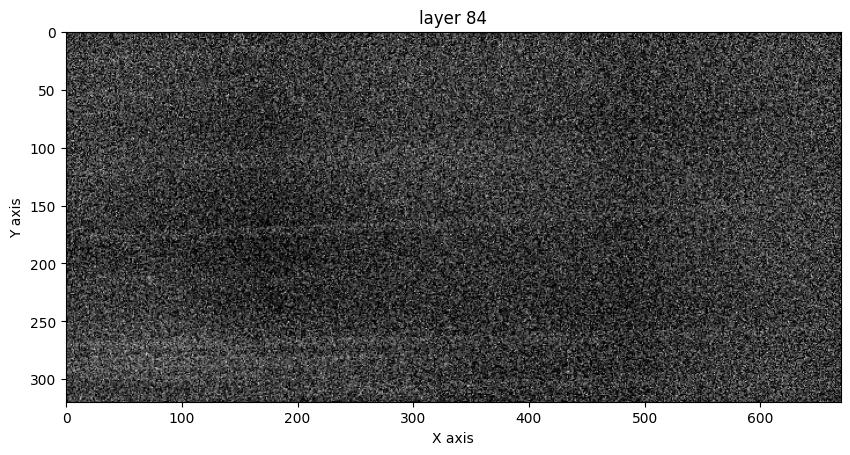

...

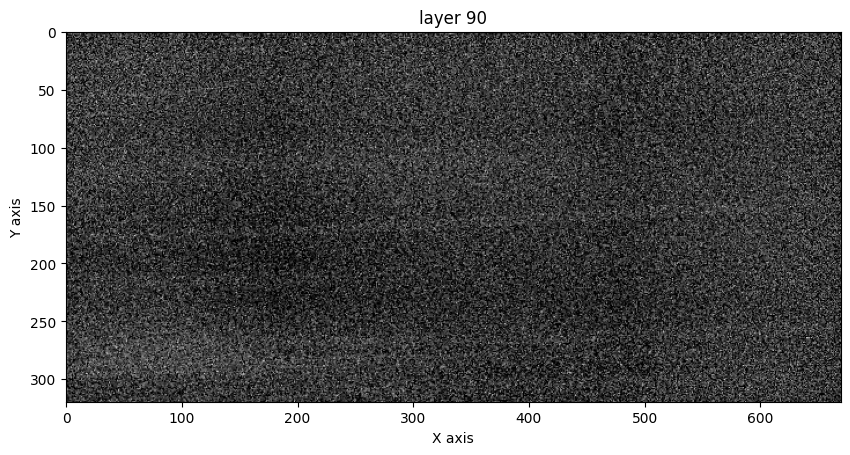

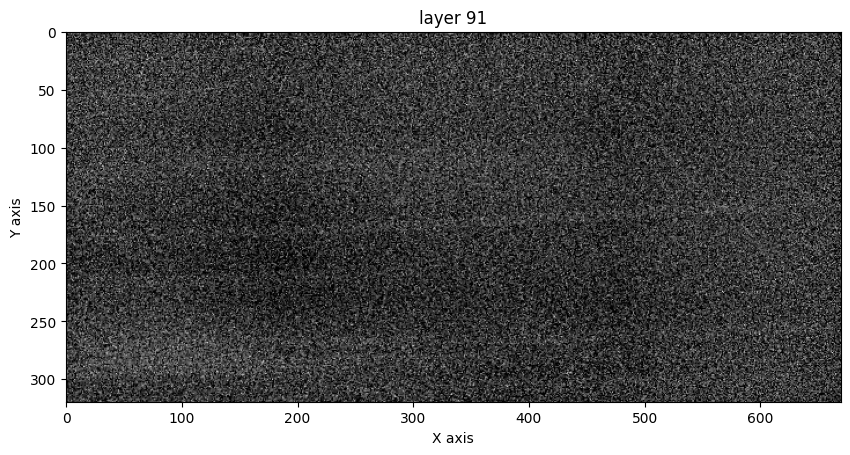

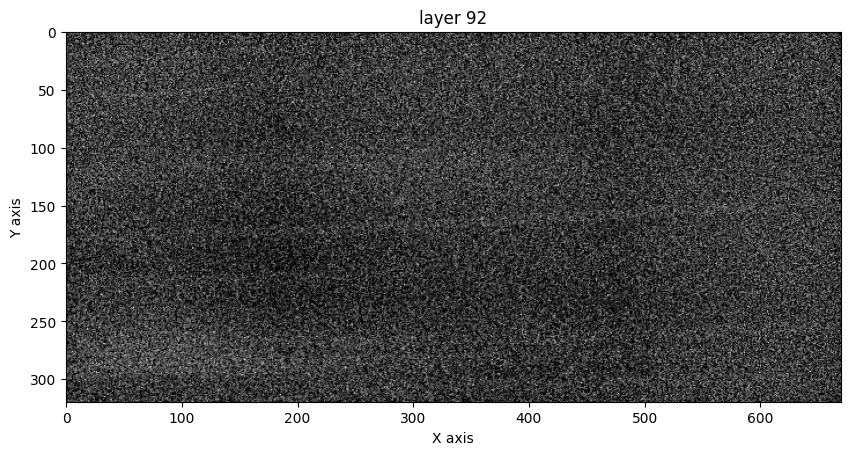

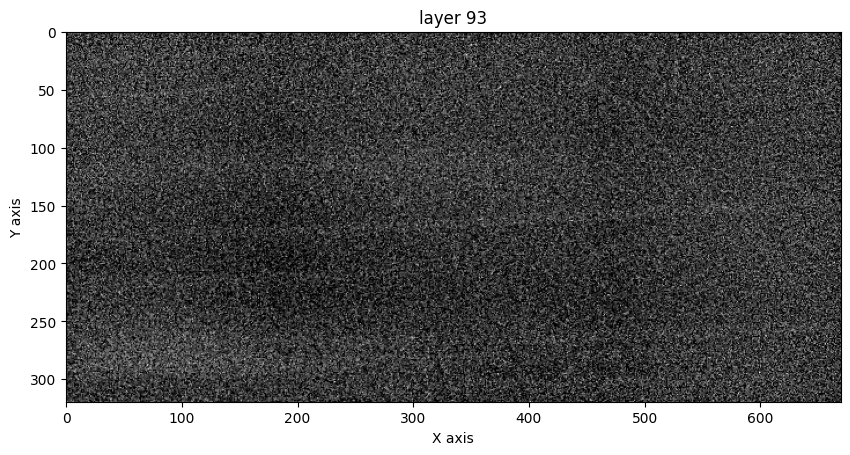

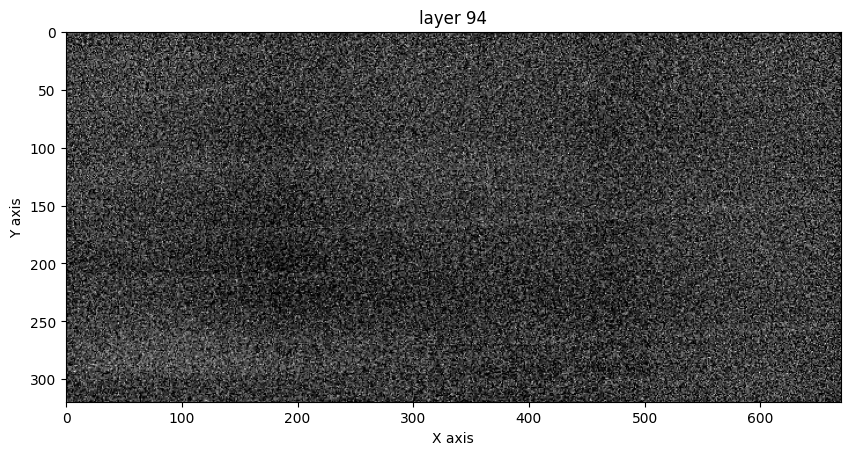

In [7]:
for layer in range(80, 95):
    plt.figure(figsize=(10, 20))
    plt.imshow(data[:,:, layer], cmap='gray')
    plt.title(f"layer {layer}")
    plt.xlabel('X axis')
    plt.ylabel('Y axis')
    plt.show()

The rebar is offset relative to all coordinate axes. Therefore, as the Z layer increases, the projection length on the XY plane changes

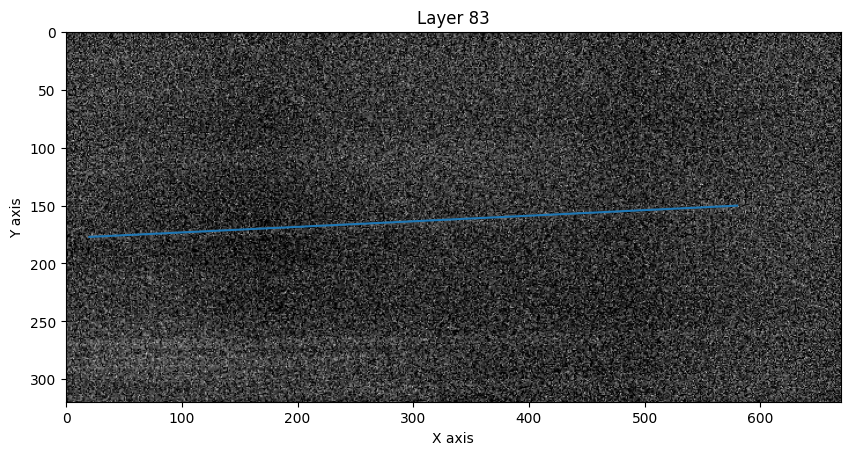

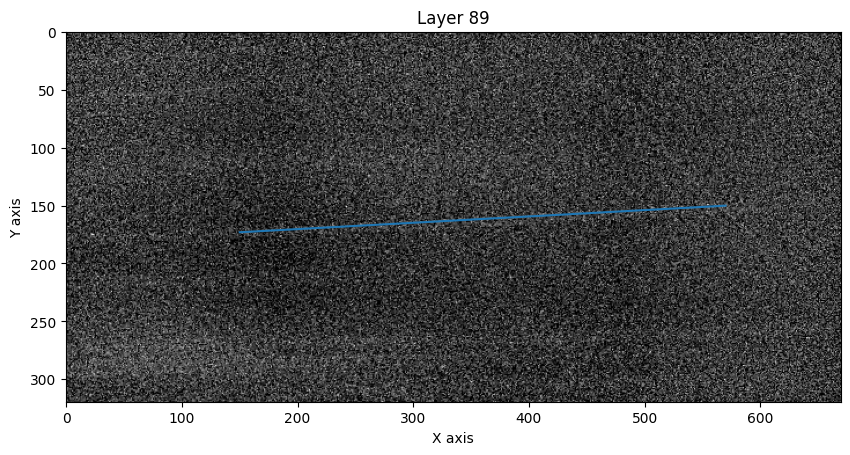

In [8]:
plt.figure(figsize=(10, 20))
plt.imshow(data[:,:, 83], cmap='gray')
plt.plot([20, 580], [177, 150])
plt.title('Layer 83')
plt.xlabel('X axis')
plt.ylabel('Y axis')
plt.show()

plt.figure(figsize=(10, 20))
plt.imshow(data[:,:, 89], cmap='gray')
plt.plot([150, 570], [173, 150])
plt.title('Layer 89')
plt.xlabel('X axis')
plt.ylabel('Y axis')
plt.show()

# Solution

## UPD

### Problem formulation

The goal of this work is to detect damage in steel rebars embedded in concrete (to find the locations where the steel is partially or fully damaged)

Formally, this is a defect (anomaly) detection problem in a 3D volume, where the model should return not only candidate to defect locations, but also it's confidence of how likely a detected anomaly is to correspond to a real defect rather than noise.

### EDA conclusions

The input data are:
- An unlabeled 3D volume (y: 320, x: 670, z: 200) of scan of a concrete structure containing several rebars
- Voxel size 3 mm;
- The locations and number of defects are unknown;
- A picture of one rebar with three defect locations indicated.

The volume contains the signal intensity (I) for each voxel -> I(y, x, z). Intensities are in range (0, 4.67), mean: 0.85, std: 0.58. The signal intensity is lower in concrete than in steel. The number of concrete voxels is much greater than the number of steel ones.

The data is strongly noisy, so areas where the density of high-intensity signals is greater than the density of low-intensity signals likely contain a steel element. The noise is unevenly distributed - at a minimum, it varies along the X-axis (0-620).


### Model selection

#### Supervised tasks

Defect detection problems are often addressed using DL (3D CNN, ViT). However, these approaches have large amount of parameters and this why they require large amount of labeled data to avoid overfitting. I can't label the data manually because it takes a lot of time and I don't have the domain expertise.

That's why the problem should be solved as an unsupervised task.

#### Unsupervised tasks

Common unsupervised anomaly detection approaches such as one-class classification or PatchCore-like methods can't be applied because these methods assume training only on normal (healthy) examples. These approaches are based on extracting embedding vectors from training data, storing them in a memory bank, and then identifying defects by searching for the most dissimilar vectors from the test sample in comparison with vectors from the memory bank. Even if there is at least one defect example in the data, it's embedding would be saved in memory bank and break the model predictions. 

Because I can't guarantee that even one of the rebars is completely healthy, these approaches can't be applied.

#### Physics-driven modeling approach

To solve this problem I should go deeper into the physics of the objects under observations and go from studying the object, its functions, building a physical model, describing it using mathematics, putting forward a hypothesis and testing this hypothesis.

##### Task
Concrete blocks rebars defect detection using the signal intensities in 3D volume. 

##### For what?

Rebar is a cylindrical steel rod embedded in concrete to support tensile loads (concrete is excellent in compression and can withstand high loads, but it crashes even under light tensile loads). When the rebar breaks, the reinforced concrete block loses its design properties, so it's important to monitor its condition.

##### Rebar physical model

A rebar can be modeled as a long steel cylinder, whose length is much greater than its diameter. It can be described by:
- a direction vector of the axis;
- a point on the axis;
- a radius;
- boundary conditions along the axis.

![Rebar](Pictures/rebar.png)

##### Main types of defects

The main defect types considered are:
- complete breaks (gaps) - loss of connectivity between parts of the rebar;
- partial loss of metal, typically due to general corrosion, leading to a reduced cross-section.

Local defects such as pitting corrosion or narrow cracks are below the spatial resolution of the scan (voxel size 3 mm) and therefore can't be reliably detected.

So the task is reduced to detecting breaks and partial loss of metal.

![Defects](Pictures/defects.png)

##### Mathematical model

The signal intensity of voxel (y, x, z) can be expressed as:
$$I(y, x, z) = F_{material}(y, x, z) + (F_{noise}(y, x, z) + N_{noise}(\mu, \sigma))$$

where 
- $F_{material}(y, x, z)$ - a function that describes inner structure of concrete block
- $F_{noise}(y, x, z)$ - a function that describes the part of noise that depends of voxel coordinates (that varies along the x axis)
- $N_{noise}(\mu, \sigma)$ - normal noise part

##### Hypothesis 1: Find $F_{material}(y, x, z)$

The problem could be reduced to finding $F_{material}(y, x, z)$, in other words, to reconstructing the shape of the rebar form as it exists - with all defects. 

This is an inverse problem and has multiple solutions, especially because of the data is highly noisy.

##### Hypothesis 2: Estimate the probability that the material is steel $P(Material=steel | I, y, x, z)$ 

To estimate the probability that the material is steel $P(Material=steel | I, y, x, z)$ I used a Gaussian Mixture Model (GMM). To provide local context I computed some statistics (mean, std, min, max, p5, p95) for each voxel within cubic neighborhoods of size 27 (3^3) and 125 (5^3) voxels. And then trained two-component GMM (steel vs concrete) on this data.

The class with higher values of intensities belonged to steel. So I got the probability that a voxel's material was steel.
However, I was unable to configure it correctly because the data is heavily noisy and the model predicted a high probability of steel in locations where it was impossible, making the model's results unreliable.

### UPD - deleted approach with GMM

In [9]:
# Computing statistics in the volume

def std(x):
    return np.std(x, ddof=1)

def p5(x):
    return np.percentile(x, 5)

def p95(x):
    return np.percentile(x, 95)

def get_stats(volume, stats=[np.mean, std, np.min, np.max, p5, p95], windows=[3, 5]) -> pd.DataFrame:
    ylim, xlim, zlim = volume.shape
    coords = []
    for x in range(xlim):
        for y in range(ylim):
            for z in range(zlim):
                coord_stats = {'x': x, 'y': y, 'z': z, 'I': volume[y, x, z]}
                for window in windows:
                    sub_volume = volume[
                        max(0, int(np.floor(y-window/2))): int(min(np.ceil(y+window/2), ylim)),
                        max(0, int(np.floor(x-window/2))): int(min(np.ceil(x+window/2), xlim)),
                        max(0, int(np.floor(z-window/2))): int(min(np.ceil(z+window/2), zlim)),
                    ].ravel()
                    
                    for st in stats:
                        coord_stats[f'{st.__name__}_{str(window)}'] = st(sub_volume)
                coords.append(coord_stats)
    return pd.DataFrame(coords)

In [10]:
%%time
new_data = data[130:190, 20:570:, 75:95] # compute is quite heavy, only the block with rebar

new_df = get_stats(new_data) # compute
new_df.head()

CPU times: total: 1min 40s
Wall time: 1min 40s


,x,y,z,I,mean_3,std_3,min_3,max_3,p5_3,p95_3,mean_5,std_5,min_5,max_5,p5_5,p95_5
0,0,0,0,0.984598,1.066320,0.437215,0.559179,1.994751,0.649411,1.746532,1.110247,0.463369,0.001468,2.514159,0.592773,1.812460
1,0,0,1,0.868318,1.120553,0.645428,0.001468,2.514159,0.308209,2.228485,1.142747,0.482659,0.001468,2.514159,0.434721,1.882908
2,0,0,2,1.117964,1.179072,0.587904,0.001468,2.514159,0.419751,2.124603,1.123191,0.480816,0.001468,2.514159,0.479370,1.858540
3,0,0,3,1.477224,1.094707,0.550849,0.001468,2.514159,0.477944,1.990069,1.081318,0.502165,0.000159,2.514159,0.040872,1.851277
4,0,0,4,0.636769,1.064019,0.614523,0.001468,2.514159,0.002503,1.990069,1.028681,0.534560,0.000159,2.514159,0.002901,1.851277


In [11]:
def get_feature_scores(gmm, X):
    """
    evaluates which features best separate two clusters and ranks them by separating power
    """
    scores = {}
    steel = gmm.means_[:, X.columns.get_loc('I')].argmax()
    
    for i, f in enumerate(X.columns): 
        if gmm.covariance_type in ['tied', 'diag']:
            var = gmm.covariances_[steel, i] + gmm.covariances_[1 - steel, i]
        else:
            var = gmm.covariances_[steel][i, i] + gmm.covariances_[1 - steel][i, i]
        
        scores[f] = abs(gmm.means_[steel, i] - gmm.means_[1 - steel, i]) / np.sqrt(var)
    
    return pd.DataFrame(scores.items(), columns=['feature', 'score']).sort_values('score', ascending=False)

# prints the obtained metal probabilities
def print_gmm_results(p_steel):
    fig, axes = plt.subplots(2, 2, figsize=(10, 5))
    axes[0][0].imshow(p_steel[:, :, 4], cmap='gray')
    axes[0][1].imshow(p_steel[:, :, 7], cmap='gray')
    axes[1][0].imshow(p_steel[:, 200, :], cmap='gray')
    axes[1][1].imshow(p_steel[:, 380, :], cmap='gray')

    axes[0][0].set_xlabel('x')
    axes[0][0].set_ylabel('y')
    axes[0][1].set_xlabel('x')
    axes[0][1].set_ylabel('y')

    axes[1][0].set_xlabel('z')
    axes[1][0].set_ylabel('y')
    axes[1][1].set_xlabel('z')
    axes[1][1].set_ylabel('y')
    
    plt.show()
    
# train the model and print results
def train_gmm(X, gmm, volume_shape):
    scaler = StandardScaler()
    X_transformed = scaler.fit_transform(X)

    gmm.fit(X_transformed)

    steel = gmm.means_[:, X.columns.get_loc('I')].argmax()
    proba = gmm.predict_proba(X_transformed)
    
    p_steel = proba[:, steel].reshape(volume_shape)
    
    print_gmm_results(p_steel)
    print(get_feature_scores(gmm, X))
    print()

All features


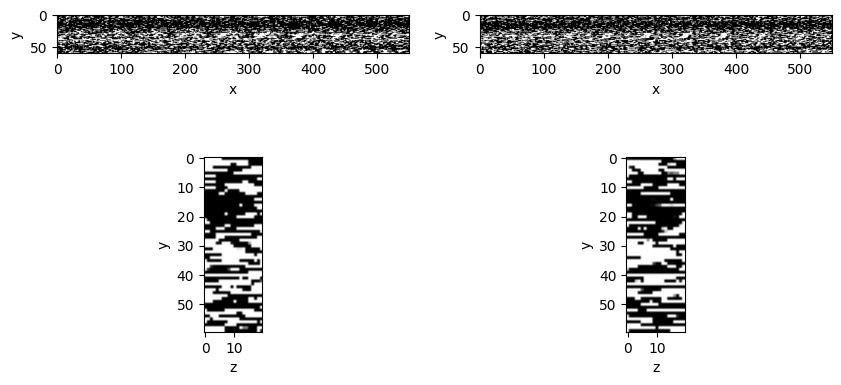

   feature     score
8     p5_3  1.016775
4   mean_3  0.937521
10  mean_5  0.861836
14    p5_5  0.567667
15   p95_5  0.488203
9    p95_3  0.436274
6    min_3  0.268396
3        I  0.266584
7    max_3  0.245344
0        x  0.225300
1        y  0.203096
13   max_5  0.197922
12   min_5  0.106401
5    std_3  0.103431
2        z  0.045229
11   std_5  0.032272

Without std, min, max


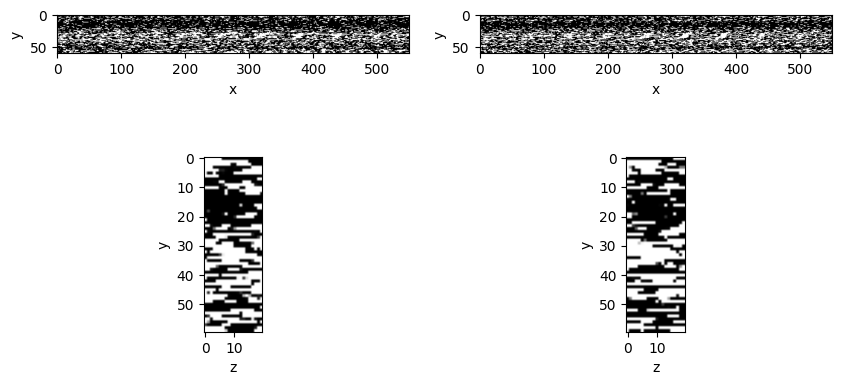

  feature     score
4  mean_3  1.024514
5    p5_3  1.006975
7  mean_5  0.889718
8    p5_5  0.554585
9   p95_5  0.511225
6   p95_3  0.469979
3       I  0.286889
0       x  0.215470
1       y  0.204276
2       z  0.065003

Only 'x', 'y', 'z', 'I', 'mean_5', 'p5_5', 'p95_5'


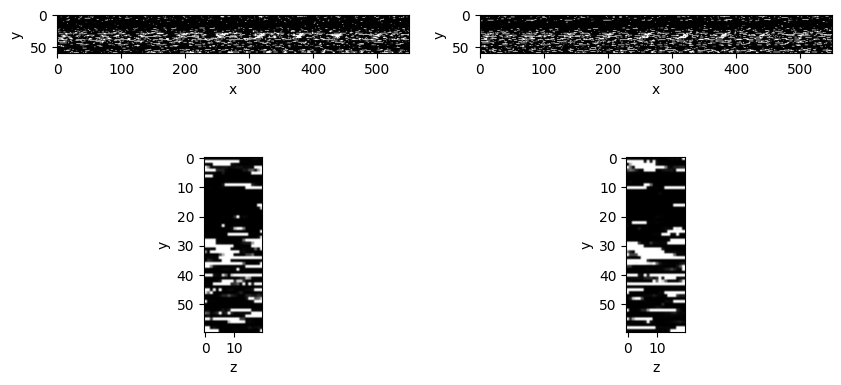

  feature     score
4  mean_5  1.162782
5    p5_5  0.944879
6   p95_5  0.622042
1       y  0.294060
0       x  0.286327
3       I  0.238507
2       z  0.088821



In [12]:
X = new_df
gmm = GaussianMixture(
    n_components=2,
    covariance_type='full',
    random_state=42
)
print('All features')
train_gmm(X, gmm, new_data.shape)


X = new_df.drop(['std_3', 'std_5', 'min_3', 'min_5', 'max_3', 'max_5'], axis=1)
gmm = GaussianMixture(
    n_components=2,
    covariance_type='full',
    random_state=42
)
print('Without std, min, max')
train_gmm(X, gmm, new_data.shape)

X = new_df[['x', 'y', 'z', 'I', 'mean_5', 'p5_5', 'p95_5']]

gmm = GaussianMixture(
    n_components=2,
    covariance_type='full',
    random_state=42
)
print("Only 'x', 'y', 'z', 'I', 'mean_5', 'p5_5', 'p95_5'")
train_gmm(X, gmm, new_data.shape)

### UPD - Model selection (continued)

##### Hypothesis 3: Transform the problem into a linear one and compare the distribution of statistics along the length of the rebar

I don’t need to evaluate the probability of steel in the volume, it only need to evaluate the rebar condition in a conditionally given area, so I can use the knowledge about the shape of ideal rebar and translate the problem into a statistical one.

The key idea: If a local statistical value differs significantly from the sample mean, it means that the rebar structure in this location differs from the normal state, so there is a defect. I can use the p-value as the confidence level of the model.

The algorithm will be as follows:
- construct a mask-cylinder of ideal rebar;
- iterate along the cylinder axis, getting cross-sections (cuts) at each iteration;
- the voxel intensity values of each cut form a sample, from which I calculate statistics (sample statistics are more stabe than individual ones) $$Stats(F_{material})$$
- then I compare the behavior of the statistics, identifying places where their behavior falls outside the confidence interval;
- determine the probability of encountering such an extreme value;
- classify locations with low probability as defective.

Simplified example with square cut (3*3) rebar:
![Example](Pictures/example.png)

However, there is still problem of noise that depends on the coordinates - that part of noise will affect on the statistics distribution, and insted of calcualating $$Stats(F_{material})$$ I can calculate only $$Stats(F_{material} + F_{noise} + N_{noise})$$

![Noise](Pictures/noise.png)

If I assume that with a small change in coordinate from the rebar area to the concrete one, the value of the material function will change greatly 
$$F_{material}(y, x, z) \neq F_{material}(y + dy, x + dx, z + dz)$$
and the local noise will be approximately the same
$$F_{noise}(y, x, z) \approx F_{noise}(y + dy, x + dx, z + dz)$$
then I can measure the statistics in the area near the rebar - measure the noise

By combining these two statistics I can get the changes of $F_{material}$

### Implementation of the approach

#### Masks

I should create two masks - the first one (cylindrical) describes the position of rebar in concrete (mask), the second one is a tube with wall thickness 'noise_msrt' - cover the cylinder and describe the area to measure the noise. 

Initial parameters of masks: radius, points of rebars axis and limitations, are determined manually. The axis is determined automatically by drawing a line between the specified points.

#### Iteration

For implementation simplicity I will iterate not along the rebar axis, but along the coordinate axis corresponding to $argmax(direction)$ (X axis).

This is an acceptable simplification because the cross-sectional area in this case is constant (although it changes from what it would be during iteration strictly along the axis) and does not significantly affect the sample size. Iterations along other axis are unacceptable because they can significantly affect the cross-sectional area and the resulting samples will be different.

![Iteration](Pictures/iteration.png)

#### Statistics selection

Because I was solving this problem for the first time, I started experimenting, immediately measuring statistics that were similar in physical meaning and then comparing them.

For each cut I computed:

- the following statistics: mean, std, (min, max), (p5, p95 (percentiles) - more stable than (min, max))
- in:
    - the cylinder interior (in)
    - the surrounding noise measurement area (noise)
- to add contextual information about next and previous cuts I computed statistics for 
    - a single cut (lin)
    - three adjacent cuts (v3) 
    - five adjacent cuts (v5)

So, 
- 'lin_in_max' - maximal intencity in the cross-section area, computed only on current cut
- 'v5_noise_std' - intencity std in the ring-like area for noise measurement, computed on current, two previous and two next cuts 

After analyzing distributions, min and max were discarded, because the maximum values in the noise measurement area exceed the values in the cylinder interior and this is not informative (the noise distribution is shifted to the right relative to the distribution inside the cylinder).

#### Statistical test to ensure that the mean distribution of statistics within a cylinder and the mean distribution in the noise measurement region are the same

I used a t-test or Wilcoxon statistical test (for samples with low p-value of Shapiro test) to test whether the distributions inside the cylinder and in the noise region differ significantly. p-value is lower than 0.05, so the means are not equal and there is statistically significant difference. This is a simple test to assess the correct orientation of the cylinder in the volume - there must be a difference

#### Reduce the noise - Signal-to-noise ratio - SNR

To compensate $F_{noise}(y, x, z)$ - the noise depended on coordinates, I used SNR-like metrics:
- By how many standard deviations of noise is the mean of the sample inside the volume higher than the mean of the semple from the noise measurement area
$$SNR_{mean} =  \frac{mean_{in} - mean_{noise}}{std_{noise}}$$
- As a more stable alternmative I used formula with percentiles - in the numerator insted of means' difference - the differtence of 95-percentiles and in the denominator insted of std - IQR(95-5)
$$SNR_{p95} =  \frac{p95_{in} - p95_{noise}}{p95_{noise} - p5_{noise}}$$

So, 
- 'snr_lin_mean' - $SNR_{mean}$ calculated on 'lin_in_mean', 'lin_noise_in', 'lin_noise_std'
- 'snr_v5_p95' - $SNR_{p95}$ calculated on 'v5_in_p95', 'v5_noise_p95', 'v5_noise_p5'

#### Probabilities

Defects correspond to locally reduced signal intensity -> to locally low SNR values.

Insted of estimating $P(Material=steel | I, y, x, z)$ the task becomes estimating the probability of observing such a low SNR value $P(snr_i | SNR)$. The p-value (the probability of observing such or an even more extreme value) is suitable for calculating the confidence of the model

Approaches: 
- empirical p-value (the proportion of sample elements is less than a given element) based on the rank of a value within the observed distribution. These p-values reflect relative abnormality, not the absolute probability of a defect.The problem is that the p-value doesn't reflect the probability of a defect. It simply represents the lowest values in the sample. So, if I analyze completely healthy rebar, I'll still get the top 5% lowest values. This probability should be interpreted as locations where defects are more likely to be relative to other locations (for example, for ranking during expert assessment, for additional analysis or for testing using a different method)
- Classical distribution-based p-value (with cumulative distribution function). In this case the probabilities are estimated correctly and there will be no defects on a healthy rebar because there no statistically significant difference. The problem is that the method requires distributional assumptions that may not always hold
- Robust alternative using median and MAD (median absolute deviation) - more stable than classical distribution-based p-value

But in any case, these probabilities only indicate the confidence of the model, and not the probability of a defect because I do not have labeled data.

#### Model implementation
I wrote a class following sklearn-like interface. Firstly, created an instance of the 'GapFinder' class (the main class)  is created, which accepts parameters: 
- statistics used to calculate SNR;
- the threshold, below which the model will recognize as a defect
- the minimum defect size (to combat noisy outlies, its possible to specify that only locations with at least two consecutive low-probability voxels are considered defects)
- maximum distance between adjacent defects for merging into a single defect.

Then called the 'fit(volume, rebar)' method to pass the initial data and the rebar object, which contains the rebar mask and its parameters, to the model. At this stage statistics and SNR-metric were computed and validated correct separation between signal and noise distributions. These results might be exported as a DataFrame for manual inspection.

Then called the 'predict()' method that returned detected defects grouped by location with confidence scores.

#### Stability analysis

Although no ground-truth labels were used for training, a reference image indicating three known defect locations was available for qualitative validation only.

- The statistical models correctly highlighted these locations.
- Additional defect candidates were identified.
- While p-values vary with hyperparameters, a part of defect locations remain stable.

When random axis parameters are provided, the model correctly identifies that the reinforcement is indistinguishable from noise.

The approach was successfully applied to other reinforcement bars, where detected defects correspond visually to darker regions in the scan.


## The end of the updated part

## Approach 

My goal is to find discontinuous or gaps in the rebar. Based on the provided data and the given deadlines, I will build a simple model - I will use statistical approach and calculate statistics near the rebar.

At the areas of rebar discontinuous the statistics will be different compare to normal areas. A sign of a defect is a statistically significant deviation of statistics in some area relative to the sample of statistics along the entire length of the rebar.

The idea is to imagine the rebar as an ideal model - a cylinder with a straight axis and a given diameter (or radius). The statistics within the volume occupied by this diameter should be uniform (typical of the metal); if there is a strong local difference (statistically significant), it can be considered a discontinuity.

The data contains unevenly distributed noise. There are highly noisy areas. To combat the noise, I will calculate statistics around the rebar and take them into account when analyzing the internal state of the rebar.

To achieve the goal I have to complete these tasks: 
- determine the model of a cylinder in the volume;
- calculate statistics in and around the volume;
- analyze these statistics;
- find outlers and determine the p-value.

Limitations:
- the approach represents the rebar as an ideal cylinder, which is a strong assumption since it does not take into account the deformations of the rebar (more accurate masks can be constructed that take deformations into account)
- the orientation of the cylinder and its parameters are determined by a person, which is labor-intensive and very inaccurate
- susceptible to noise in the data

Advantages:
- simple and fast
- interpretable model
- nice baseline model - may be improved

## Determine the model of a cylinder in the volume

The cylinder will be defined using a radius, an axis direction vector, and a point on the axis.

The radius is defined as the average cross-section size (in voxels). The axis vector and point are determined using PCA method for points on the axis

In [13]:
def projection_plots(x, y, z, w=10, h=(200, 150), data=data):
    """
    Build two slides in YZ and XY projections
    x, y, z - alleged coordinates of the cylinder axis
    w - sizes of the square
    h - Y limitations
    """

    fig, ax = plt.subplots(1, 2, figsize=(5, 6))
    ax[0].imshow(data[:, x, :], cmap='gray', aspect='equal')
    rect = Rectangle(
        (z - w/2, y-w/2), 
        w, w,     
        edgecolor='red',
        facecolor='none'
    )
    ax[0].set_xlim(70,100)
    ax[0].set_ylim(h)
    ax[0].add_patch(rect)
    ax[0].set_title(f'ZY projection, X={x}')
    ax[0].set_xlabel('Z axis')
    ax[0].set_ylabel('Y axis')
    
    ax[1].imshow(data[:, :, z], cmap='gray', aspect='equal')
    ax[1].set_xlim(x-15,x+15)
    ax[1].set_ylim(h)

    rect = Rectangle(
        (x-2, y-w/2), 
        4, w,     
        edgecolor='red',
        facecolor='none'
    )
    ax[1].add_patch(rect)
    ax[1].set_title(f'XY projection, Z={z}')
    ax[1].set_xlabel('X axis')
    ax[1].set_ylabel('Y axis')
    plt.tight_layout()
    plt.show()

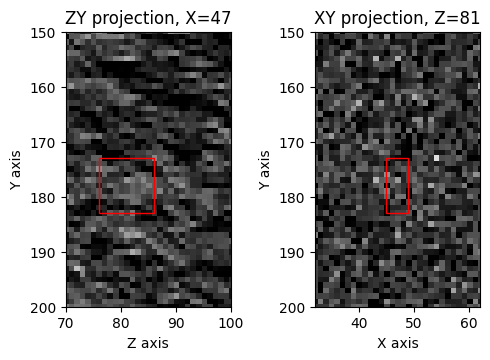

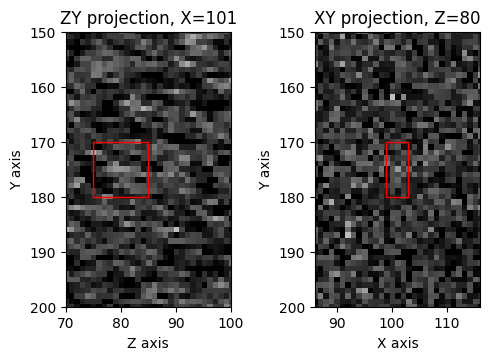

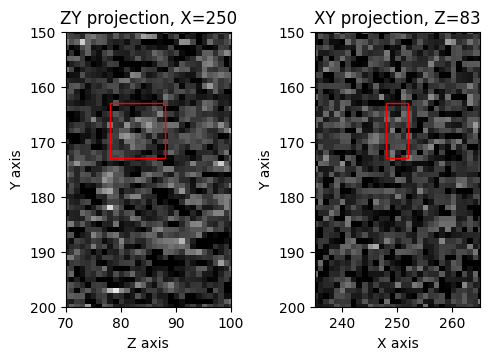

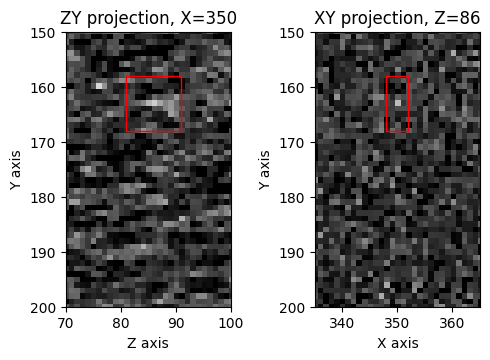

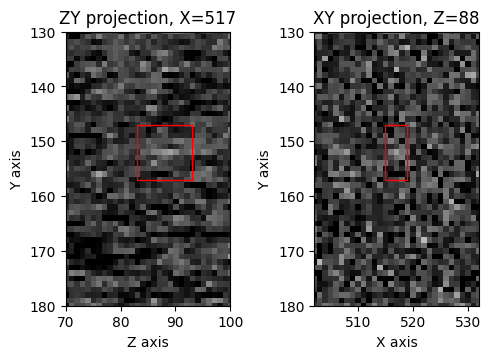

In [14]:
projection_plots(47, 178, 81)
projection_plots(101, 175, 80)
projection_plots(250, 168, 83)
projection_plots(350, 163, 86)
projection_plots(517, 152, 88, h=(180, 130))

Thus, the points on the rebar axis were very roughly determined

The radius was taken as 4 voxels, meaning the diameter with a voxel size of 3 mm would be 24 mm, which is quite typical

In [15]:
R = 4

points = np.array([
    [47, 178, 81],
    [101, 175, 80], 
    [250, 168, 83], 
    [350, 163, 86],
    [517, 152, 88]
]) # X, Y, Z

In [16]:
pca = PCA(n_components=1)
pca.fit(points)

point_on_line = pca.mean_
direction = pca.components_[0]

print("Point_on_line:", point_on_line) # X, Y, Z
print("Direction (dx, dy, dz):", direction) # X, Y, Z

def distance_point_to_line(point, point_on_line, direction):
    v = point - point_on_line
    return np.linalg.norm(v - np.dot(v, direction) * direction)

RMSE = np.sqrt(np.array([
        distance_point_to_line(point, point_on_line, direction)
        for point in points
    ])**2).mean()

print(f'RMSE of approximation: {RMSE:.3f} voxels')

Point_on_line: [253.  167.2  83.6]
Direction (dx, dy, dz): [ 0.99839089 -0.05406368  0.01710995]
RMSE of approximation: 1.023 voxels


The cylinder is oriented in volume, RMSE is acceptable

Now build the mask

In [17]:
Y, X, Z = np.meshgrid(
    np.arange(data.shape[0]),  # y
    np.arange(data.shape[1]),  # x
    np.arange(data.shape[2]),  # z
    indexing='ij'
)

dx = X - point_on_line[0]
dy = Y - point_on_line[1]
dz = Z - point_on_line[2]

cx = dy * direction[2] - dz * direction[1]
cy = dz * direction[0] - dx * direction[2]
cz = dx * direction[1] - dy * direction[0]

distances = np.sqrt(cx**2 + cy**2 + cz**2)

noise_msmt = 4 # Noise measurement area, voxels
mask = np.zeros(data.shape, dtype=bool)
noise_mask = mask.copy()

mask[distances<=R] = True
noise_mask[(distances>R)&(distances<=R+noise_msmt)] = True

# boundaries of rebar
mask[:,570:,:] = False
mask[:,:20,:] = False
noise_mask[:,570:,:] = False
noise_mask[:,:20,:] = False

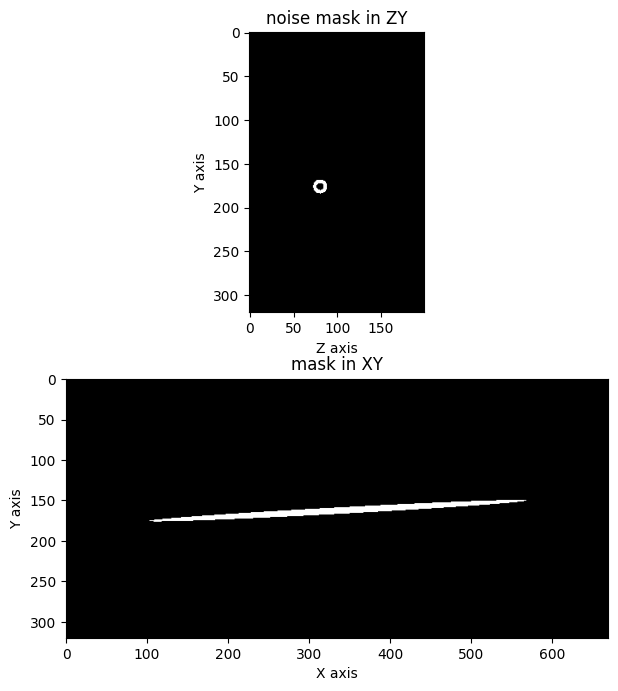

In [18]:
fig, axes = plt.subplots(2, 1, figsize=(7, 8))

axes[0].imshow(noise_mask[:,90,:], cmap='gray')
axes[0].set_xlabel('Z axis')
axes[0].set_ylabel('Y axis')
axes[0].set_title('noise mask in ZY')


axes[1].imshow(mask[:,:,85], cmap='gray')
axes[1].set_xlabel('X axis')
axes[1].set_ylabel('Y axis')
axes[1].set_title('mask in XY')

plt.show()

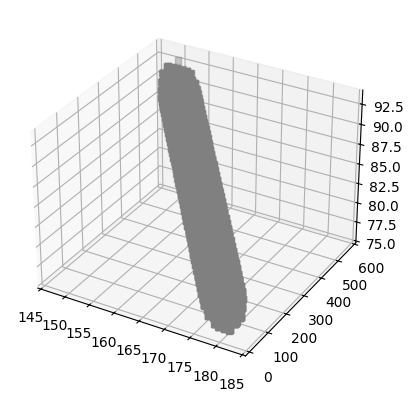

In [19]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

x, y, z = np.where(mask == 1)
ax.scatter(x, y, z, c='gray', marker='s')
plt.show()

## Calculate statistics in and around the volume

Now I'll iterate through the layers along the main direction (X), calculate the statistics and save them in pd.DataFrame

The fact that the X-axis and the rebar axis do not strictly coincide does not matter.

Statistics:
- mean
- std
- min
- max
- p5, p95 - percentiles

volumes:
- lin - statistics are calculated only in the layer
- v3 - statistics are calculated in the volume with neighbor layers
- v5 - statistics are calculated in the volume with 2 neighbor layers

Statistics types:
- in - statistics are calculated in the volume of rebar
- noise - statistics are calculated in the noise measurement area, next to the rebar

In [20]:
cuts = []
for x in range(20, 570):
    t = (x - point_on_line[0]) * direction[0]
    y = int(point_on_line[1] + t * direction[1])
    z = int(point_on_line[2] + t * direction[2])

    cut = {'x': x, 'y': y, 'z': z}

    for prefix, _data in [
        ('lin_in', data[:, x, :][mask[:, x, :]]),
        ('v3_in', data[:, x-1:x+2, :][mask[:, x-1:x+2, :]]),
        ('v5_in', data[:, x-2:x+3, :][mask[:, x-2:x+3, :]]),
        ('lin_noise', data[:, x, :][noise_mask[:, x, :]]),
        ('v3_noise', data[:, x-1:x+2, :][noise_mask[:, x-1:x+2, :]]),
        ('v5_noise', data[:, x-2:x+3, :][noise_mask[:, x-2:x+3, :]]),
    ]:
        cut[f'{prefix}_mean'] = np.mean(_data)
        cut[f'{prefix}_std'] = _data.std(ddof=1)
        cut[f'{prefix}_min'] = _data.min()
        cut[f'{prefix}_max'] = _data.max()
        cut[f'{prefix}_p5'], cut[f'{prefix}_p95'] = np.percentile(_data, (5, 95))
        
    cuts.append(cut)
    
df = pd.DataFrame(cuts)

In [21]:
df.head()

,x,y,z,lin_in_mean,lin_in_std,lin_in_min,lin_in_max,lin_in_p5,lin_in_p95,v3_in_mean,...,v3_noise_min,v3_noise_max,v3_noise_p5,v3_noise_p95,v5_noise_mean,v5_noise_std,v5_noise_min,v5_noise_max,v5_noise_p5,v5_noise_p95
0,20,179,79,0.770075,0.554824,4.366792e-03,2.048839,0.008825,1.815357,0.861522,...,1.000000e-08,2.426767,0.004516,1.741413,0.885744,0.588377,1.000000e-08,3.431243,0.003750,1.911545
1,21,179,79,0.954836,0.720815,2.394498e-03,2.841434,0.068391,2.285435,0.878880,...,1.000000e-08,3.431243,0.003750,1.911545,0.879704,0.580737,1.000000e-08,3.431243,0.003535,1.908072
2,22,179,79,0.913249,0.520169,1.915071e-05,2.358604,0.002952,1.674670,0.874613,...,1.000000e-08,3.431243,0.003483,1.936624,0.910187,0.573880,1.000000e-08,3.431243,0.003784,1.889682
3,23,179,79,0.757359,0.569099,1.000000e-08,2.268977,0.000155,1.711174,0.847461,...,1.000000e-08,3.431243,0.003271,1.936670,0.959291,0.590355,1.000000e-08,3.431243,0.004256,1.937402
4,24,179,79,0.871297,0.462690,8.624563e-06,2.088586,0.001756,1.425070,0.818867,...,1.000000e-08,2.589402,0.004549,1.910653,0.957006,0.586950,1.000000e-08,3.431243,0.004184,1.949410


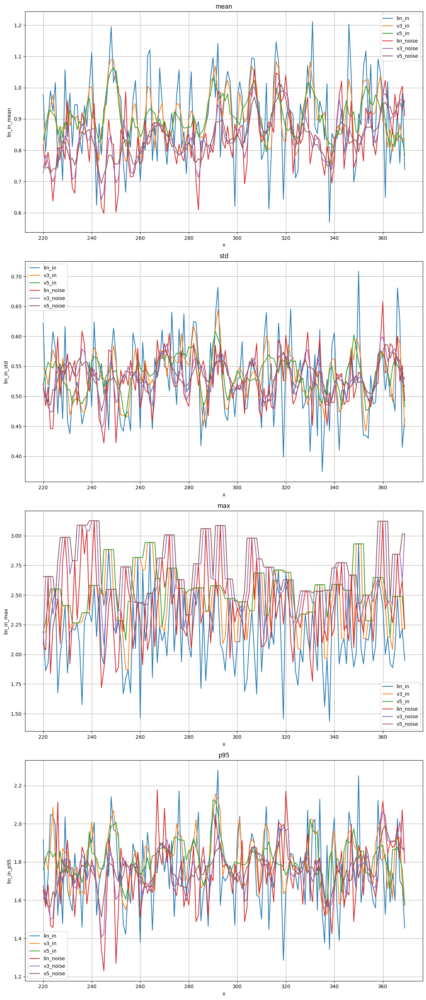

In [22]:
stats = ['mean', 'std', 'max', 'p95']
prefixes = ['lin_in', 'v3_in', 'v5_in', 'lin_noise', 'v3_noise', 'v5_noise']

fig, axes = plt.subplots(len(stats), 1, figsize=(12, 7*len(stats)))

for i, stat in enumerate(stats):
    ax = axes[i]
    
    for prefix in prefixes:
        col = f'{prefix}_{stat}'
        sns.lineplot(data=df[200:350], x='x', y=col, ax=ax, label=prefix)
    
    ax.set_title(stat)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

Now that I have statistics for internal volume and noise, I can evaluate whether the orientation of the cylinder in the volume matches the rebar under observation

Visually, the distributions are quite similar.
- The mean in the cylinder is shifted to the right relative to the noise mean, as expected
- The standard deviation appears similar
- The maximum in the cylinder is unusually shifted to the left relative to the noise maximum
- However, the 95th percentile in the cylinder is shifted to the right relative to the 95th percentile of the noise, as expected. This makes it a more reliable estimate than the maximum

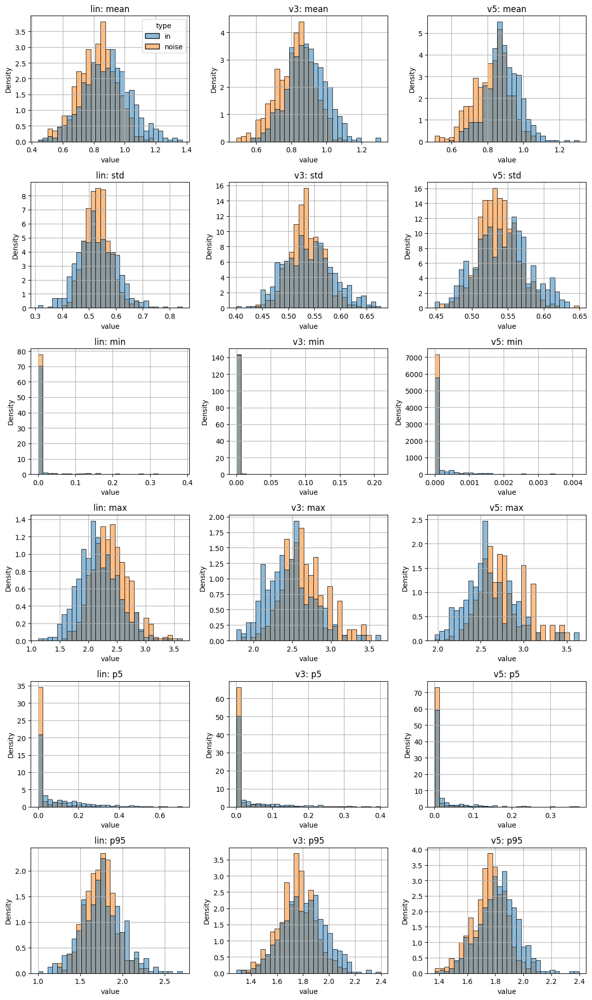

In [23]:
stats = ['mean', 'std', 'min', 'max', 'p5', 'p95']

groups = ['lin', 'v3', 'v5']

fig, axes = plt.subplots(
    len(stats), len(groups),
    figsize=(12, 20),
    sharey=False
)

for col_idx, group in enumerate(groups):
    for row_idx, stat in enumerate(stats):
        ax = axes[row_idx, col_idx]

        col_in = f'{group}_in_{stat}'
        col_noise = f'{group}_noise_{stat}'
        
        df_long = pd.DataFrame({
            'value': pd.concat([df[col_in], df[col_noise]]),
            'type': (['in'] * len(df)) + (['noise'] * len(df))
        })

        sns.histplot(
            data=df_long,
            x='value',
            hue='type',
            bins=30,
            stat='density',
            common_norm=False,
            alpha=0.5,
            ax=ax,
            legend=(row_idx == 0 and col_idx == 0)
        )

        ax.set_title(f'{group}: {stat}')
        ax.grid(True)

plt.tight_layout()
plt.show()

To verify that the cylinder matches the rebar under observation, I'll conduct a statistical test

Null hypothesis: The average signal value inside the cylinder is no greater than the noise - the cylinder is randomly oriented

Alternative hypothesis: The average signal value is greater than the average noise - the cylinder matches the rebar.

Check whether the data follow a normal distribution

The Shapiro tests show p-values significantly below 0.05 — it doesn't follow the normal distribution

The QQ-plots show minor deviations in the tails

v3_in: ShapiroResult(statistic=np.float64(0.9963467782609485), pvalue=np.float64(0.24035933124193487))
v5_in: ShapiroResult(statistic=np.float64(0.9909632800586944), pvalue=np.float64(0.0019165752420371696))
v3_noise: ShapiroResult(statistic=np.float64(0.9917803969298193), pvalue=np.float64(0.003874902801474752))
v5_noise: ShapiroResult(statistic=np.float64(0.9885614265688292), pvalue=np.float64(0.0002695167258026591))


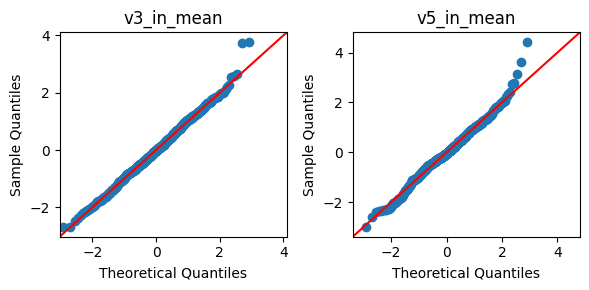

In [24]:
print('v3_in:', shapiro(df.v3_in_mean))
print('v5_in:', shapiro(df.v5_in_mean))

print('v3_noise:', shapiro(df.v3_noise_mean))
print('v5_noise:', shapiro(df.v5_noise_mean))


cols = ['v3_in_mean', 'v5_in_mean']

fig, axes = plt.subplots(1, 2, figsize=(6, 3))

for ax, col in zip(axes, cols):
    values = df[col]
    values = (values - np.mean(values)) / np.std(values) 
    sm.qqplot(values, line='45', ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

Since the values are correlated, the samples are not independent - so I will use Wilcoxon test for paired samples. 

p-value < 0.05 -> the null hypothesis may be rejected

In [25]:
stat, p = wilcoxon(
    df.v3_in_mean, 
    df.v3_noise_mean, 
    alternative='greater'
)
print(f'v3 wilcoxon: {stat}, p-value: {p}')

stat, p = wilcoxon(
    df.v5_in_mean, 
    df.v5_noise_mean, 
    alternative='greater'
)
print(f'v5 wilcoxon: {stat}, p-value: {p}')


stat, p = ttest_rel(
    df.v3_in_mean,
    df.v3_noise_mean,
    alternative='greater'
)
print(f'v3 ttest: {stat}, p-value: {p}')

stat, p = ttest_rel(
    df.v5_in_mean,
    df.v5_noise_mean,
    alternative='greater'
)
print(f'v5 ttest: {stat}, p-value: {p}')

v3 wilcoxon: 122327.0, p-value: 4.314041613108594e-36
v5 wilcoxon: 130834.0, p-value: 1.142856635916518e-49
v3 ttest: 14.50111605895096, p-value: 7.072795124101811e-41
v5 ttest: 17.92309993317385, p-value: 3.37308835644006e-57


The problem is non-uniform noise, which varies along the X-axis and affects the signal strength in dark (gray) and light (yellow) areas

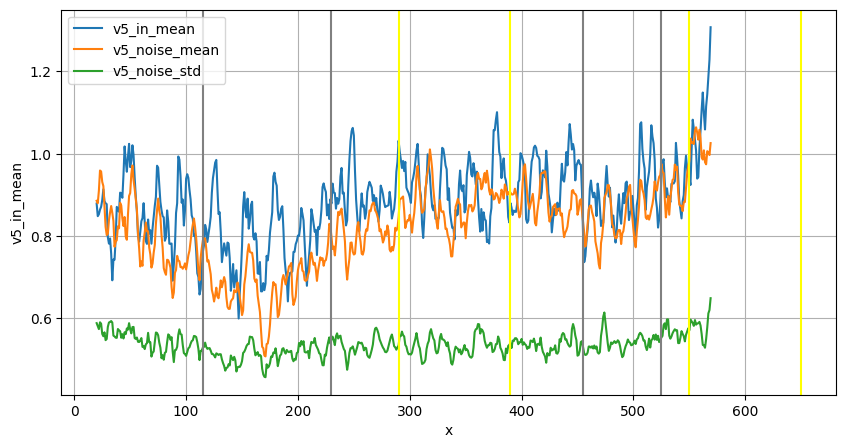

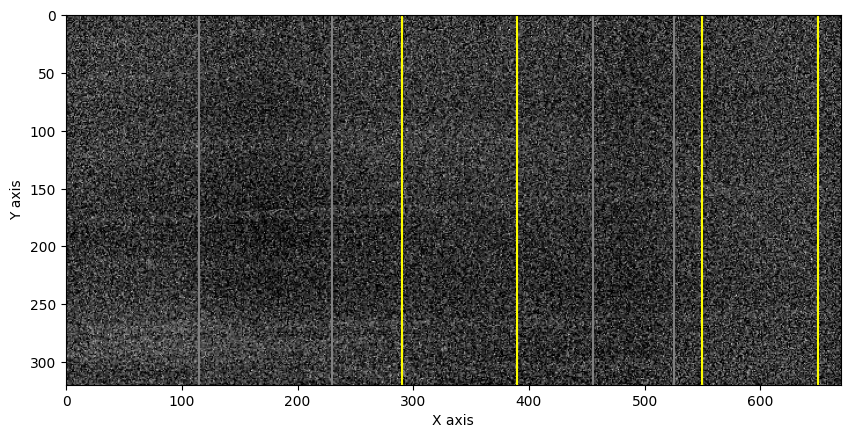

In [26]:
plt.figure(figsize=(10, 5))

sns.lineplot(data=df, x='x', y='v5_in_mean', label='v5_in_mean')
sns.lineplot(data=df, x='x', y='v5_noise_mean', label='v5_noise_mean')
sns.lineplot(data=df, x='x', y='v5_noise_std', label='v5_noise_std')
plt.legend()
plt.grid(True)
plt.axvline(115, c='gray')
plt.axvline(230, c='gray')

plt.axvline(290, c='yellow')
plt.axvline(390, c='yellow')


plt.axvline(455, c='gray')
plt.axvline(525, c='gray')

plt.axvline(550, c='yellow')
plt.axvline(650, c='yellow')
plt.show()


plt.figure(figsize=(10, 10))
plt.imshow(data[:, :, 86], cmap='gray')
plt.xlabel('X axis')
plt.ylabel('Y axis')

plt.axvline(115, c='gray')
plt.axvline(230, c='gray')

plt.axvline(290, c='yellow')
plt.axvline(390, c='yellow')


plt.axvline(455, c='gray')
plt.axvline(525, c='gray')

plt.axvline(550, c='yellow')
plt.axvline(650, c='yellow')

plt.show()

To eliminate the influence of noise, I will apply and compare several SNR approaches:
- SNR - by how many standard deviations of noise does the mean value in the object differ from the noise mean?
- observe the upper tail of the distribution to answer the question: Is there any metal in the area at all?

In [27]:
df['snr_lin_mean'] = (df['lin_in_mean'] - df['lin_noise_mean']) / (df['lin_noise_std'] + 1e-16)
df['snr_lin_p95'] = (df['lin_in_p95'] - df['lin_noise_p95']) / (df['lin_noise_p95'] - df['lin_noise_p5'] + 1e-16)

df['snr_v3_mean'] = (df['v3_in_mean'] - df['v3_noise_mean']) / (df['v3_noise_std'] + 1e-16)
df['snr_v3_p95'] = (df['v3_in_p95'] - df['v3_noise_p95']) / (df['v3_noise_p95'] - df['v3_noise_p5'] + 1e-16)

df['snr_v5_mean'] = (df['v5_in_mean'] - df['v5_noise_mean']) / (df['v5_noise_std'] + 1e-16)
df['snr_v5_p95'] = (df['v5_in_p95'] - df['v5_noise_p95']) / (df['v5_noise_p95'] - df['v5_noise_p5'] + 1e-16)

The results are well correlated

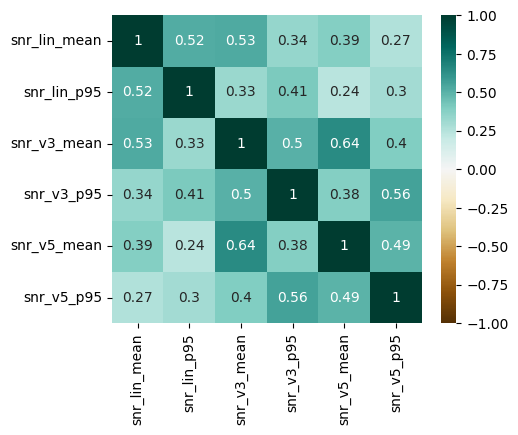

In [28]:
df_corr = df[['snr_lin_mean', 'snr_lin_p95', 'snr_v3_mean', 'snr_v3_p95', 'snr_v5_mean', 'snr_v5_p95']].corr(method = 'kendall')

fig = plt.figure(figsize=(5, 4))

sns.heatmap(df_corr,
			xticklabels = df_corr.columns,
			yticklabels = df_corr.columns,
			annot = True,
			cmap = 'BrBG', vmin = -1, vmax = 1)
plt.show()

As the sample size for which statistics were calculated increases, the standard deviation decreases

In [29]:
df[['snr_lin_mean', 'snr_lin_p95', 'snr_v3_mean', 'snr_v3_p95', 'snr_v5_mean', 'snr_v5_p95']].describe()

,snr_lin_mean,snr_lin_p95,snr_v3_mean,snr_v3_p95,snr_v5_mean,snr_v5_p95
count,550.000000,5.500000e+02,550.000000,550.000000,550.000000,550.000000
mean,0.129029,2.118579e-02,0.124924,0.036811,0.124097,0.038074
std,0.299287,1.658352e-01,0.199371,0.102990,0.161399,0.079274
min,-0.695953,-4.143347e-01,-0.435609,-0.261436,-0.328242,-0.181263
25%,-0.079465,-8.848564e-02,-0.011499,-0.035058,0.015061,-0.014631
50%,0.124056,-9.058673e-07,0.120225,0.030883,0.123120,0.032761
75%,0.333073,1.276651e-01,0.253196,0.103867,0.215619,0.085919
max,1.072558,7.034835e-01,0.690146,0.384288,0.638434,0.302484


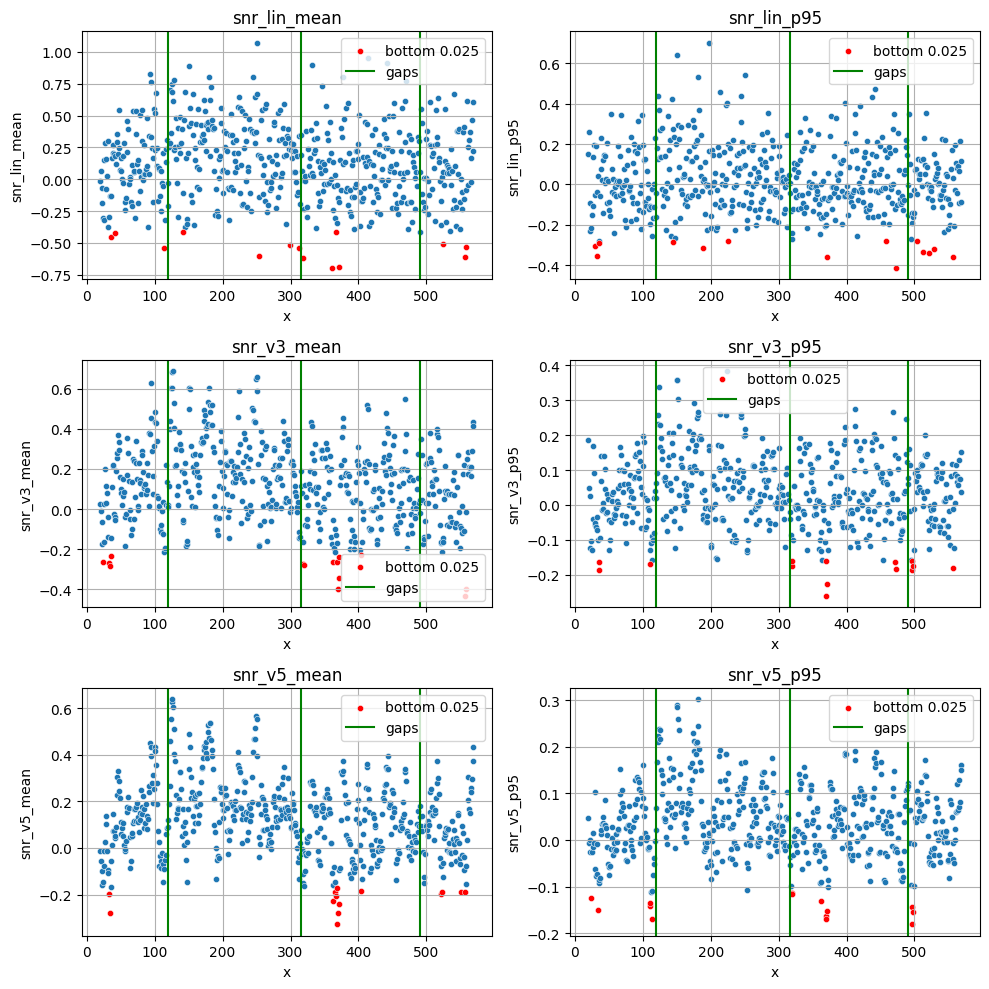

In [30]:
graphs = ['snr_lin_mean', 'snr_lin_p95','snr_v3_mean', 'snr_v3_p95', 'snr_v5_mean', 'snr_v5_p95']


fig, axes = plt.subplots(3, 2, figsize=(10, 10))
axes = axes.flatten()

alpha = 0.025

for ax, graph in zip(axes, graphs):
    threshold = df[graph].quantile(alpha)

    sns.scatterplot(
        data=df[df[graph] > threshold],
        x='x',
        y=graph,
        ax=ax,
        s=20
    )

    sns.scatterplot(
        data=df[df[graph] <= threshold],
        x='x',
        y=graph,
        ax=ax,
        color='red',
        s=20,
        label=f'bottom {alpha}'
    )

    ax.axvline(120, c='green', label='gaps')
    ax.axvline(316, c='green')
    ax.axvline(490, c='green')
    ax.legend()

    ax.grid(True)
    ax.set_title(graph)

plt.tight_layout()
plt.show()

Statistics calculated for a single layer yield rather noisy results

Statistics calculated by volume can to localize defects quite well

Statistics calculated by percentiles yield more grouped results

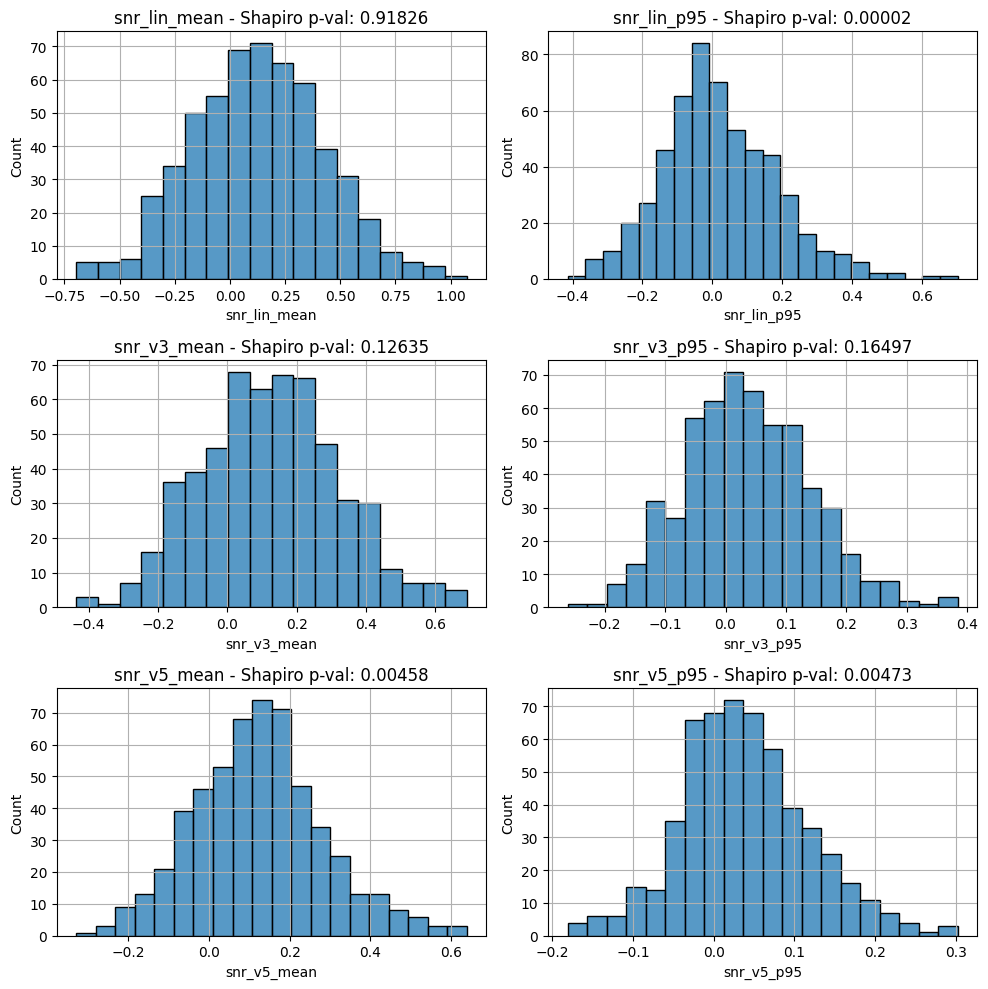

In [31]:
graphs = ['snr_lin_mean', 'snr_lin_p95','snr_v3_mean', 'snr_v3_p95', 'snr_v5_mean', 'snr_v5_p95']

fig, axes = plt.subplots(3, 2, figsize=(10, 10))
axes = axes.flatten()

for ax, graph in zip(axes, graphs):

    sns.histplot(
        data=df[graph],
        ax=ax,
    )
    ax.grid(True)
    ax.set_title(f'{graph} - Shapiro p-val: {shapiro(df[graph]).pvalue:.5f}')

plt.tight_layout()
plt.show()

For the given statistics, I will calculate:
- Empirical probability - the probability that a defect may be present at a given location. Empirical probability reflects an estimate of the likelihood of a defect occurring at a given point in space. This value does not represent the actual probability of the defect's presence at a specific point.
- p-value
- robust p-value

The p-value assumes a normal distribution, so it is not appropriate for all statistics.

In [32]:
stats = ['snr_v3_mean', 'snr_v5_mean', 'snr_v3_p95', 'snr_v5_p95']

# empirical probability
for stat in stats:
    df[f'p_empirical_{stat}'] = df[stat].apply(lambda x: (df[stat] <= x).mean())

# p-value
for stat in stats:
    df[f'p_val_{stat}'] = norm.cdf(
        (df[stat] - df[stat].mean()) / df[stat].std()
    )

# robust p-value
for stat in stats:
    df[f'p_val_mad_{stat}'] = norm.cdf(
        (df[stat] - df[stat].median()) / (1.4826 * np.median(np.abs(df[stat] - df[stat].median())))
    )

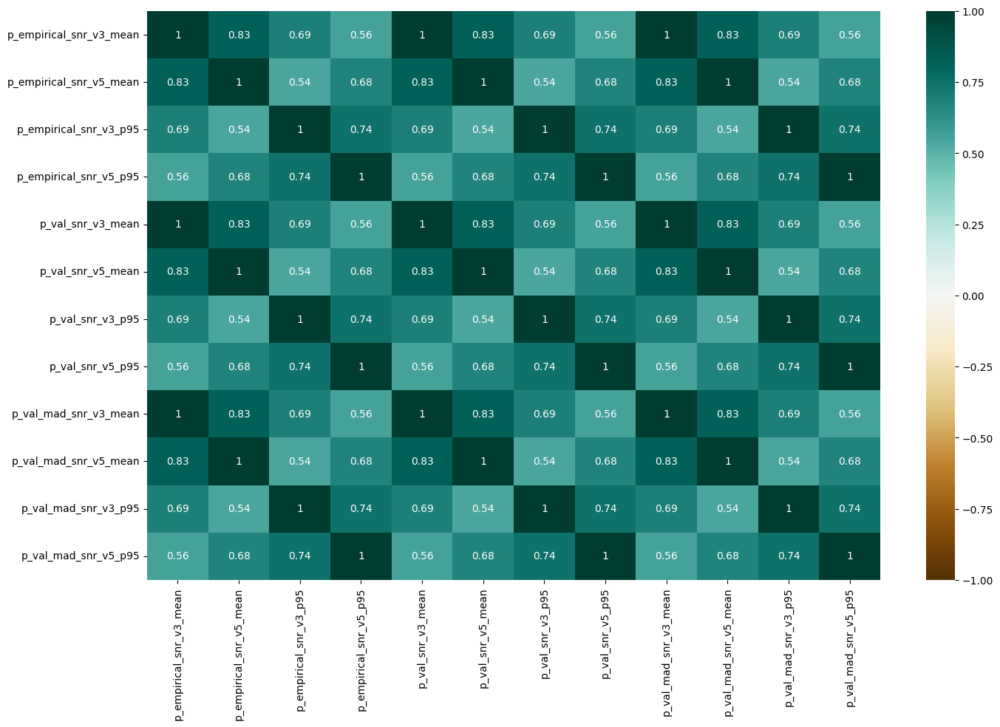

In [33]:
cols = [
    'p_empirical_snr_v3_mean', 'p_empirical_snr_v5_mean', 'p_empirical_snr_v3_p95', 'p_empirical_snr_v5_p95',
    'p_val_snr_v3_mean', 'p_val_snr_v5_mean', 'p_val_snr_v3_p95', 'p_val_snr_v5_p95',
    'p_val_mad_snr_v3_mean', 'p_val_mad_snr_v5_mean', 'p_val_mad_snr_v3_p95', 'p_val_mad_snr_v5_p95'
]

df_corr = df[cols].corr(method='spearman')

fig = plt.figure()
fig.set_size_inches(16,10)

sns.heatmap(df_corr,
			xticklabels = df_corr.columns,
			yticklabels = df_corr.columns,
			annot = True,
			cmap = 'BrBG', vmin = -1, vmax = 1)
plt.show()

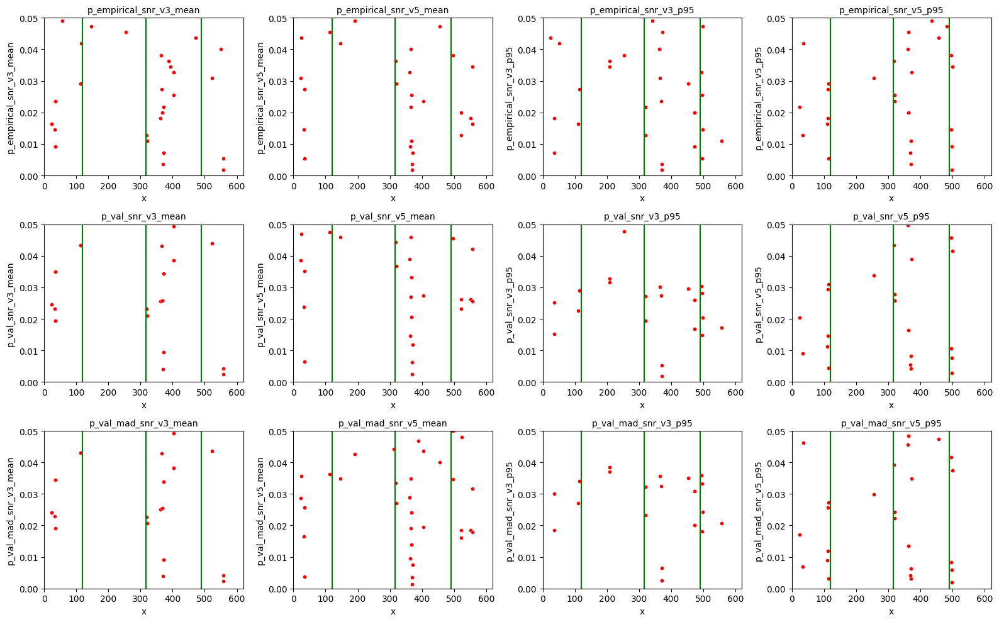

In [34]:
fig, axes = plt.subplots(3, 4, figsize=(16, 10))
axes = axes.flatten()

for ax, col in zip(axes, cols):
    y = df[col]
    sns.scatterplot(df[df[col]<=0.05], x='x', y=col, color='red', s=20, ax=ax)
    ax.set_xlim(0, 620)
    ax.set_ylim(0, 0.05)
    ax.axvline(120, c='green')
    ax.axvline(316, c='green')
    ax.axvline(490, c='green')
    
    ax.set_title(col, fontsize=10)

plt.tight_layout()
plt.show()